### Imported Libraries and Constants:

In [1]:
import cv2
import os
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import pandas as pd


import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import array_to_img, img_to_array, load_img, to_categorical
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, CSVLogger
from scikeras.wrappers import KerasClassifier

import random

from sklearn.model_selection import train_test_split

from sklearn.model_selection import GridSearchCV

from sklearn.metrics import roc_auc_score, roc_curve, auc

import types
import pickle

##### constants:

In [2]:
img_height = 100
img_width = 100
num_classes = 84

### Load Data

In [3]:
def resize_without_squeezing(image, target_size):
    h, w = image.shape[:2]
    aspect_ratio = w / h

    # Calculate new size while preserving aspect ratio
    if aspect_ratio > 1:
        new_w = target_size
        new_h = int(target_size / aspect_ratio)
    else:
        new_h = target_size
        new_w = int(target_size * aspect_ratio)

    # Resize the image
    resized_img = cv2.resize(image, (new_w, new_h))

    # Create a canvas with the target size and fill with padding color
    canvas = np.full((target_size, target_size, 3), (255,255,255), dtype=np.uint8)

    # Calculate the position to paste the resized image in the center
    y_offset = (target_size - new_h) // 2
    x_offset = (target_size - new_w) // 2

    # Paste the resized image onto the canvas
    canvas[y_offset:y_offset + new_h, x_offset:x_offset + new_w] = resized_img

    return canvas

In [4]:
def get_folders_in_directory(directory_path):
    # Get the list of all files and folders in the specified directory
    items = os.listdir(directory_path)
    # Filter out only the folders from the list
    folders = [item for item in items if os.path.isdir(os.path.join(directory_path, item))]
    return folders
    
def load_images_from_folder(folder):
    # Function to load and preprocess images from a folder
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, filename))
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
            img = resize_without_squeezing(img,img_height)
            #img = cv2.resize(img, (img_height, img_width))
            images.append(img)
    return images

In [5]:
base_dir = '../data/dataset'
labels_name = get_folders_in_directory(base_dir) # get the list of folder names
labels_dict = {label:i for i,label in enumerate(labels_name)} # assign an int for each folder name = asana

# Get all images and corresp labels
all_images=[]
all_labels=[]
d={}
for label in labels_name:
    new_images = load_images_from_folder(base_dir+'/'+label)
    d[label]=len(new_images)
    all_images = all_images + new_images
    for i in range(len(new_images)):
        all_labels.append(labels_dict[label])

# Ensure that all_image_paths and all_labels are numpy arrays for easier manipulation
images = np.array(all_images)/255 # normalize images to the range [0-1]
labels = np.array(all_labels)

# Shuffle indices
indices = np.arange(len(images))
np.random.shuffle(indices)

# Use the shuffled indices to reorder X and y
images_shuffled = images[indices]
labels_shuffled = labels[indices]

images = images_shuffled
labels = labels_shuffled

In [6]:
# number of images for each folder
sorted_d = dict(sorted(d.items(), key=lambda item: item[1]))
sorted_d

{'agnistambhasana': 39,
 'virabhadrasana': 39,
 'ashtanga namaskara': 40,
 'hanumanasana': 40,
 'janu sirsasana a': 40,
 'krounchasana': 40,
 'marichyasana': 40,
 'navasana': 40,
 'parivrtta janu sirsasana': 40,
 'parivrtta parsvakonasana': 40,
 'parsvottanasana': 40,
 'phalakasana': 40,
 'pincha mayurasana': 40,
 'supta padangusthasana': 40,
 'tadasana': 40,
 'utthita ashwa sanchalanasana': 40,
 'utthita parsvakonasana': 40,
 'anjaneyasana': 41,
 'padmasana': 41,
 'parighasana': 41,
 'pasasana': 41,
 'vajrasana': 41,
 'balasana': 42,
 'bitilasana': 42,
 'baddha konasana': 43,
 'bhujangasana': 43,
 'kapotasana': 43,
 'uttanasana': 43,
 'ananda balasana': 44,
 'bakasana': 44,
 'dwi pada viparita dandasana': 44,
 'malasana': 44,
 'marichyasana c': 44,
 'marjaryasana': 44,
 'vrschikasana': 44,
 'chaturanga dandasana': 45,
 'dhanurasana': 45,
 'salamba bhujangasana': 45,
 'urdhva mukha svanasana': 45,
 'uttana shishosana': 45,
 'ardha pincha mayurasana': 46,
 'gomukhasana': 46,
 'mayurasan

### Model

In [18]:
# Initialising the ImageDataGenerator class.
# We will pass in the augmentation parameters in the constructor.
datagen = ImageDataGenerator(
        rotation_range = 30,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip = True
        #preprocessing_function=add_noise
)

In [19]:
def create_DN2():
    # adding BatchNormalization
    ptrain_model = tf.keras.applications.DenseNet121(input_shape=(img_height,img_width,3),
                                                      include_top=False,
                                                      weights='imagenet',
                                                      pooling='avg')
    ptrain_model.trainable = False
    
    inputs = ptrain_model.input

    # Trying different configurations, such as [512, 256], [256, 128], etc., could be beneficial.
    drop_layer = tf.keras.layers.Dropout(0.25)(ptrain_model.output)
    x_layer = tf.keras.layers.Dense(512, activation='relu')(drop_layer)
    x_layer = tf.keras.layers.BatchNormalization()(x_layer)
    
    x_layer1 = tf.keras.layers.Dense(256, activation='relu')(x_layer)
    x_layer1 = tf.keras.layers.BatchNormalization()(x_layer1)
    
    drop_layer1 = tf.keras.layers.Dropout(0.20)(x_layer1)
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(drop_layer1)
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
                  
    return model 

In [20]:
def compile_model(model, optimizer, metrics):
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=metrics)
    return model

In [28]:
def save_model(model, name):
    model_file = f'../models/{name}.pkl'
    with open(model_file, 'wb') as f:
        pickle.dump(model, f)

### Split data

In [22]:
# Split the dataset into training and temporary sets (combined validation and test)
train_data, temp_data, train_labels, temp_labels = train_test_split(
    images, labels, test_size=0.3, random_state=42
)

# Split the temporary set into validation and test sets
val_data, test_data, val_labels, test_labels = train_test_split(
    temp_data, temp_labels, test_size=0.5, random_state=42
)

train_labels_one_hot = to_categorical(train_labels, num_classes=num_classes)
val_labels_one_hot = to_categorical(val_labels, num_classes=num_classes)
test_labels_one_hot = to_categorical(test_labels, num_classes=num_classes)

### Train Model

In [25]:
def train_model(train_data, val_data, test_data, train_labels_one_hot, val_labels_one_hot, test_labels_one_hot, model_type, optimizer, batch_size, num_epochs, metrics=['accuracy']):

    result_dict = {}
    result_dict["optimizer"] = optimizer
    result_dict["num_epochs"] = num_epochs
    result_dict["batch_size"] = batch_size
   
    if model_type == 'CNN':
        model = create_CNN()
    elif model_type == 'DenseNet':
        model = create_DN2()
    # optimizer
    initial_learning_rate = 0.001
    lr_schedule = keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate, decay_steps=10000, decay_rate=0.9, staircase=True)
    if optimizer=='adam':
        opt = keras.optimizers.Adam(learning_rate=lr_schedule)
    elif optimizer=='rmsprop':
        opt = keras.optimizers.RMSprop(learning_rate=lr_schedule)
    elif optimizer=='SGD':
        opt = keras.optimizers.SGD(learning_rate=lr_schedule)

    # compile model
    model = compile_model(model, opt, metrics)

    # train model
    early_stopping = EarlyStopping(monitor='val_accuracy', mode='max', min_delta=0.001, verbose=1, patience = 5, restore_best_weights=True)

    train_datagen = datagen.flow(train_data, train_labels_one_hot, batch_size=batch_size)
    val_datagen = datagen.flow(val_data, val_labels_one_hot, batch_size=batch_size)
    history = model.fit(train_datagen, epochs=num_epochs, callbacks=[early_stopping], validation_data=val_datagen)

    # Evaluate the model on the test set
    test_loss, test_acc = model.evaluate(test_data, test_labels_one_hot)
    print(f'Test accuracy: {test_acc}')

    result_dict["actual_num_epochs"] = len(history.history['loss'])
    result_dict["accuracy"] = test_acc
    return result_dict, model       

### Import model

In [ ]:
model_file = '../models/param_iteration_dn.pkl'
with open(model_file, 'rb') as f:
    model = pickle.load(f)

### 'main'

In [23]:
opt='adam'
b_size= 32
n_ep=50

In [26]:
d, model = train_model(train_data, val_data, test_data, train_labels_one_hot, val_labels_one_hot, test_labels_one_hot, 
                            'DenseNet', opt, b_size, n_ep, metrics=['accuracy'])



Epoch 1/50


86/86 [==============================] - 35s 319ms/step - loss: 4.3643 - accuracy: 0.0602 - val_loss: 3.8940 - val_accuracy: 0.1096
Epoch 2/50
86/86 [==============================] - 25s 292ms/step - loss: 3.3351 - accuracy: 0.1652 - val_loss: 3.0605 - val_accuracy: 0.2380
Epoch 3/50
86/86 [==============================] - 25s 286ms/step - loss: 2.9042 - accuracy: 0.2467 - val_loss: 2.8564 - val_accuracy: 0.2586
Epoch 4/50
86/86 [==============================] - 24s 277ms/step - loss: 2.6542 - accuracy: 0.2930 - val_loss: 2.5950 - val_accuracy: 0.3168
Epoch 5/50
86/86 [==============================] - 23s 271ms/step - loss: 2.5015 - accuracy: 0.3194 - val_loss: 2.5268 - val_accuracy: 0.3236
Epoch 6/50
86/86 [==============================] - 24s 273ms/step - loss: 2.3886 - accuracy: 0.3495 - val_loss: 2.5091 - val_accuracy: 0.3271
Epoch 7/50
86/86 [==============================] - 24s 275ms/step - loss: 2.3163 - accuracy: 0.3568 - val_loss: 2.3916 - val_accuracy: 0.

In [29]:
save_model(model,"dn2_1")

INFO:tensorflow:Assets written to: C:\Users\lucia\AppData\Local\Temp\tmp2xi8br4r\assets


INFO:tensorflow:Assets written to: C:\Users\lucia\AppData\Local\Temp\tmp2xi8br4r\assets


### AUC-ROC

In [36]:
legend = pd.read_csv("../data/yoga_poses.csv")
legend_dict = legend["Name"].to_dict()

In [39]:
def ROC_curve(model, test_labels_one_hot, labels_dict):
    y_true = test_labels_one_hot
    y_pred_prob = model.predict(test_data)

    # Calculate ROC curve and AUC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_pred_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    
    # Plot ROC curve for each class
    plt.figure(figsize=(6, 3)) # Add more colors as needed
    for i in range(num_classes):
        plt.plot(fpr[i], tpr[i], color='red', lw=2, label='Class {0} (AUC = {1:0.2f})'.format((i,labels_dict[i]), roc_auc[i]))
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver Operating Characteristic (ROC) Curve for Multi-Class')
        plt.legend(loc="lower right")
        plt.show()

##### before cleaning

###### 1

24/24 [==============================] - 5s 196ms/step


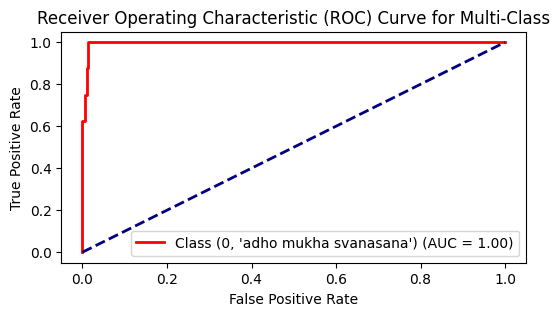

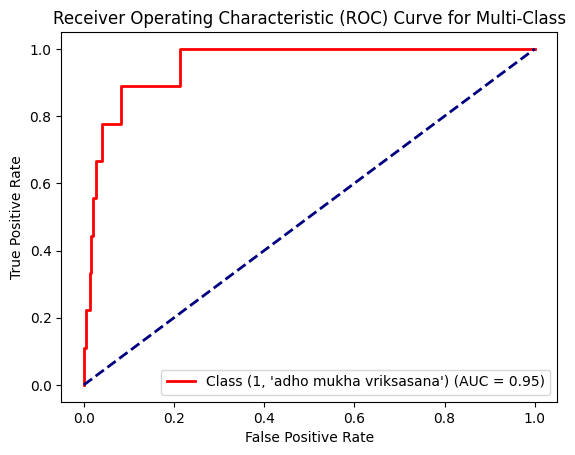

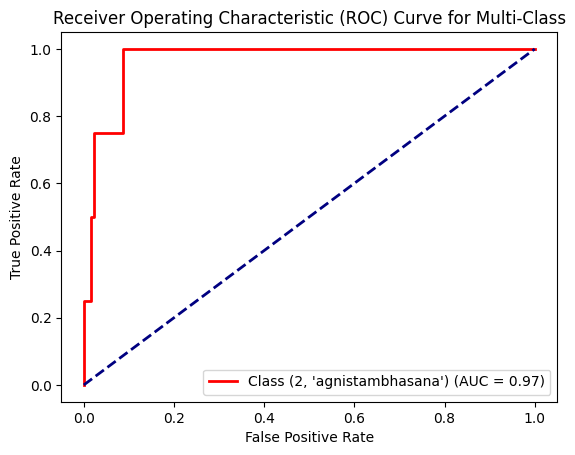

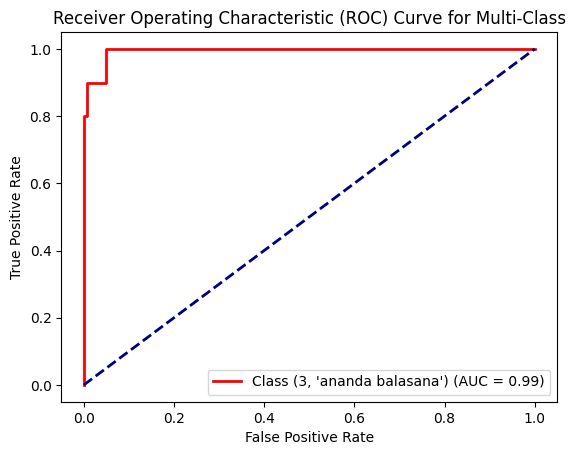

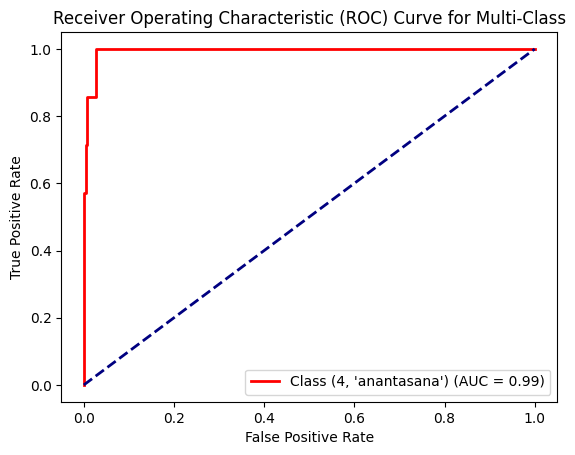

...

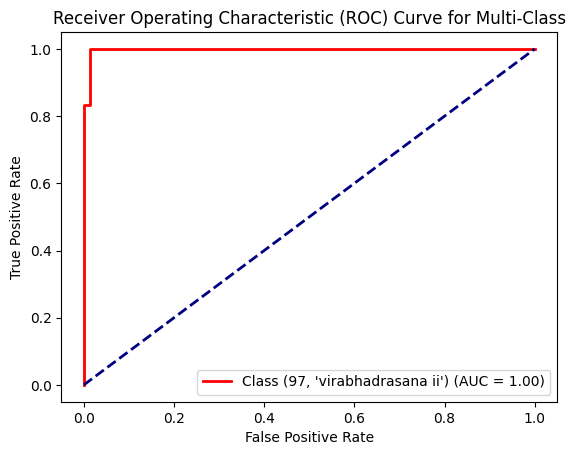

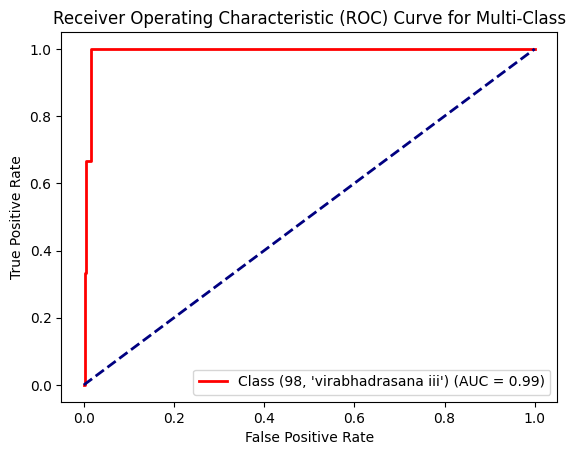

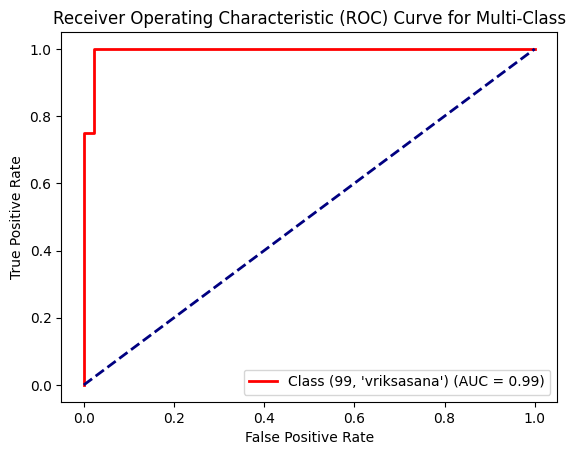

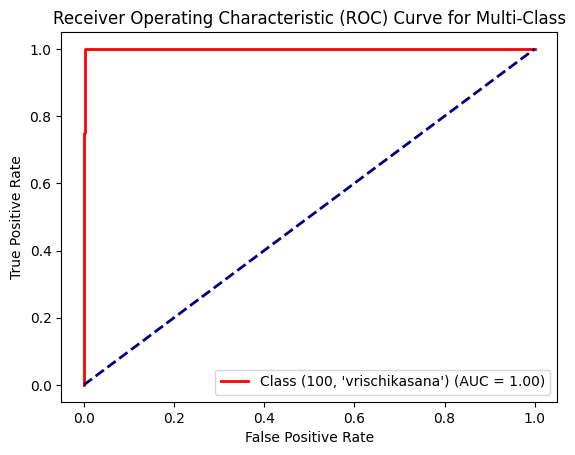

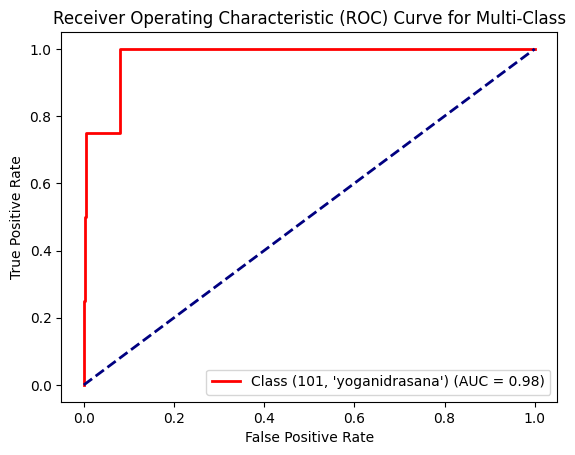

In [19]:
y_true = test_labels_one_hot
y_pred_prob = model.predict(test_data)

# Calculate ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure(figsize=(6, 3)) # Add more colors as needed
for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], color='red', lw=2, label='Class {0} (AUC = {1:0.2f})'.format((i,labels_dict2[i]), roc_auc[i]))
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve for Multi-Class')
    plt.legend(loc="lower right")
    plt.show()

In [25]:
pred_labels = np.argmax(y_pred_prob, axis=1)
test_labels = np.argmax(test_labels_one_hot, axis=1)

24/24 [==============================] - 5s 189ms/step


In [28]:
pred_labels_list = list(pred_labels)
test_labels_list = list(test_labels)

In [35]:
Column1 = []
Column2 = []
for i in range(len(pred_labels_list)):
    if pred_labels_list[i]!=test_labels_list[i]:
        Column1.append(labels_dict2[pred_labels_list[i]])
        Column2.append(labels_dict2[test_labels_list[i]])

In [ ]:
# errors for position
wrong = pd.DataFrame( {"Predicted_Position":Column1,"True_Position":Column2})
wrong.sort_values(by=["Predicted_Position"],inplace=True,ignore_index=True)
#print(wrong["Predicted_Position"].value_counts().to_string())

###### 2

24/24 [==============================] - 9s 202ms/step


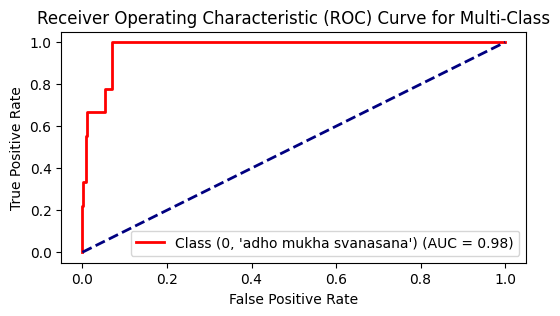

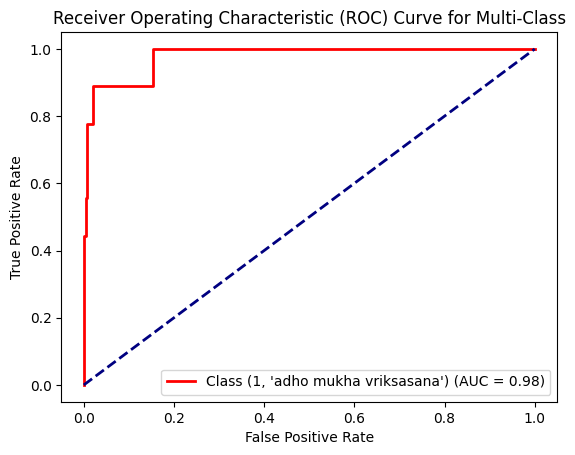

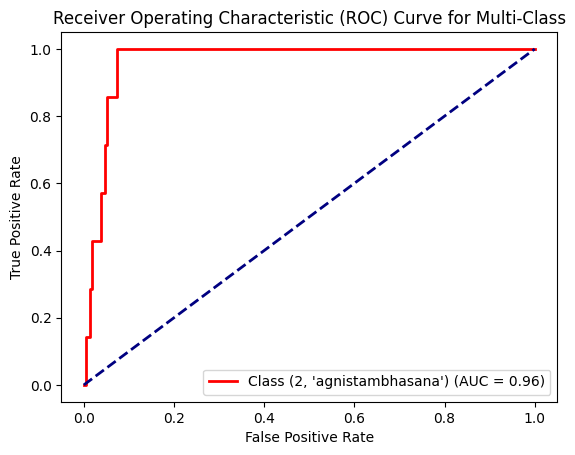

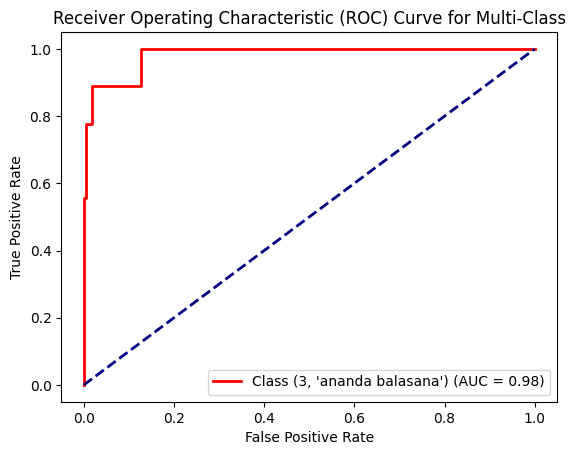

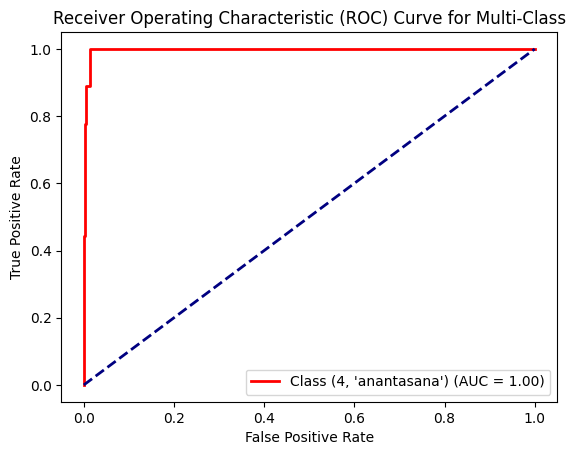

...

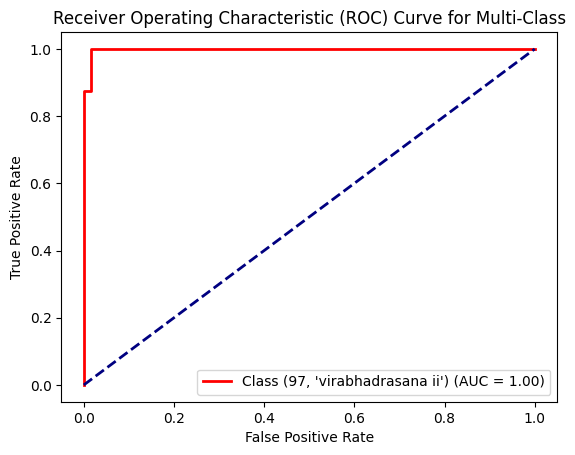

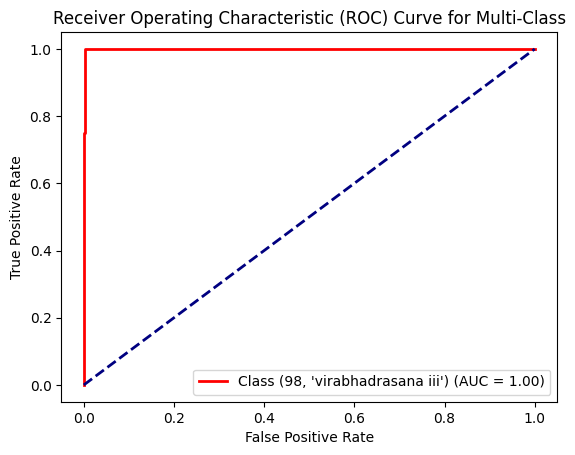

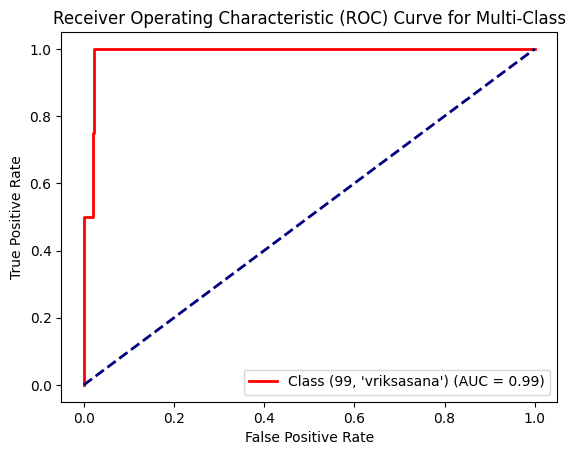

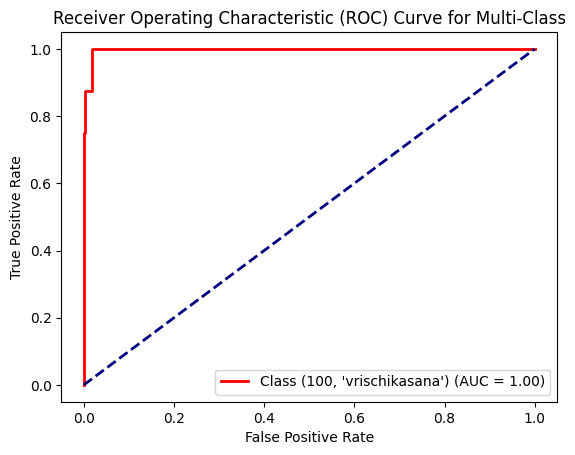

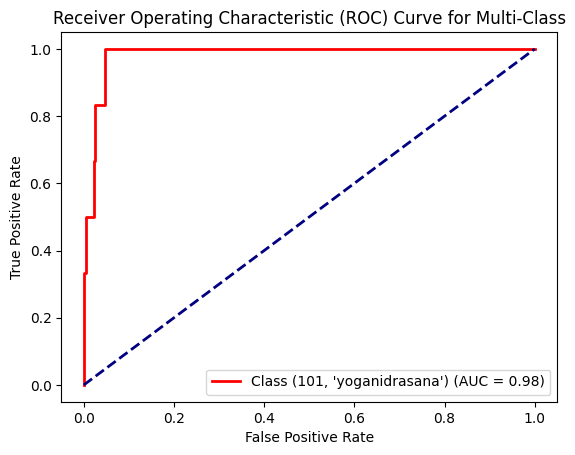

In [63]:
y_true = test_labels_one_hot
y_pred_prob = model.predict(test_data)

# Calculate ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure(figsize=(6, 3)) # Add more colors as needed
for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], color='red', lw=2, label='Class {0} (AUC = {1:0.2f})'.format((i,labels_dict2[i]), roc_auc[i]))
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve for Multi-Class')
    plt.legend(loc="lower right")
    plt.show()

In [64]:
pred_labels = np.argmax(y_pred_prob, axis=1)
test_labels = np.argmax(test_labels_one_hot, axis=1)

In [65]:
pred_labels_list = list(pred_labels)
test_labels_list = list(test_labels)

In [66]:
Column1 = []
Column2 = []
for i in range(len(pred_labels_list)):
    if pred_labels_list[i]!=test_labels_list[i]:
        Column1.append(labels_dict2[pred_labels_list[i]])
        Column2.append(labels_dict2[test_labels_list[i]])

In [ ]:
# errors for position
wrong = pd.DataFrame( {"Predicted_Position":Column1,"True_Position":Column2})
wrong.sort_values(by=["Predicted_Position"],inplace=True,ignore_index=True)
#print(wrong["Predicted_Position"].value_counts().to_string())

##### after cleaning

###### dn2_1

19/19 [==============================] - 4s 217ms/step


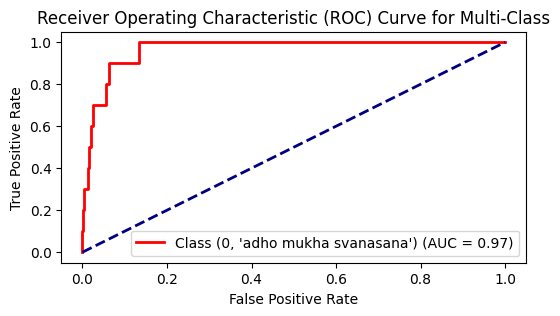

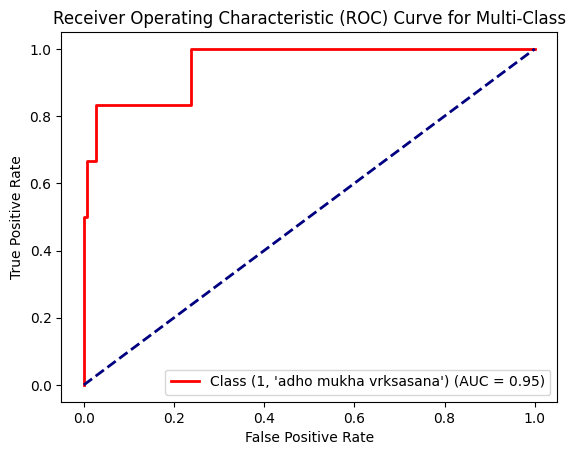

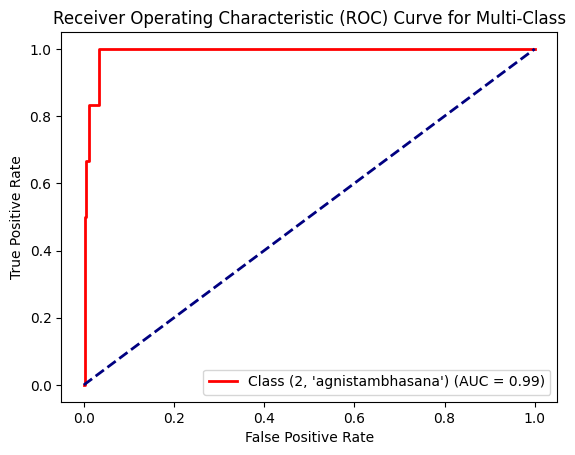

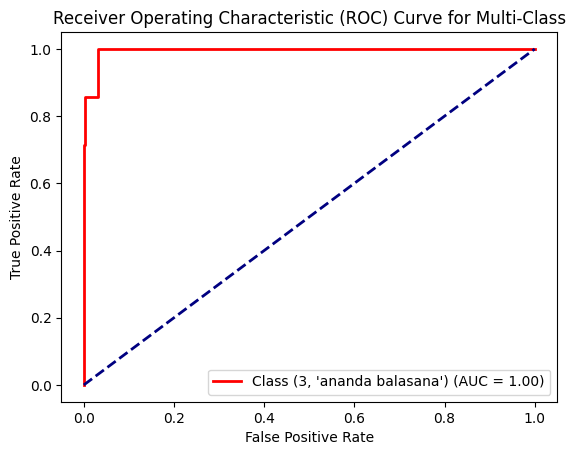

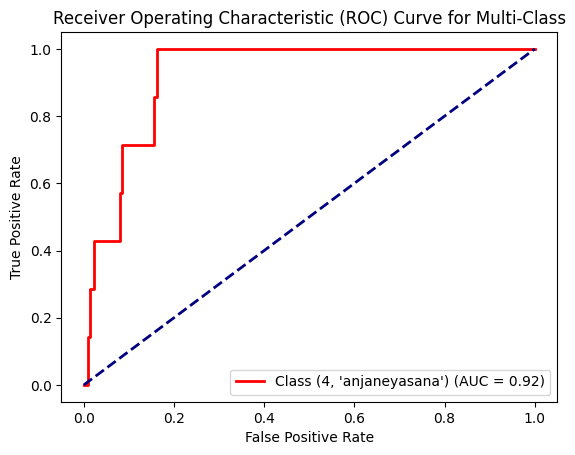

...

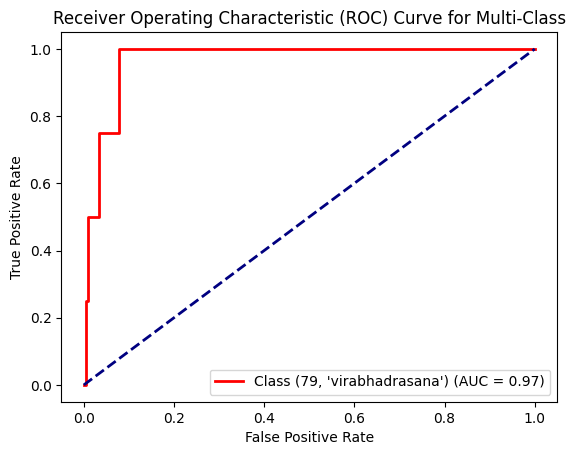

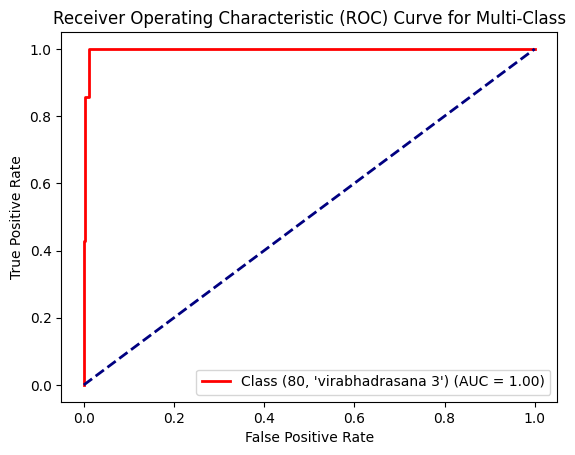

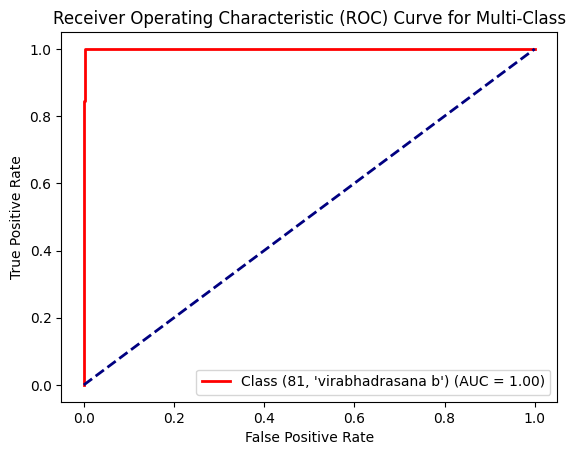

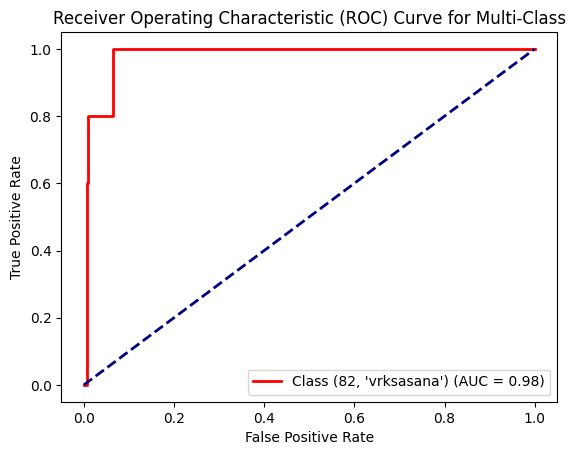

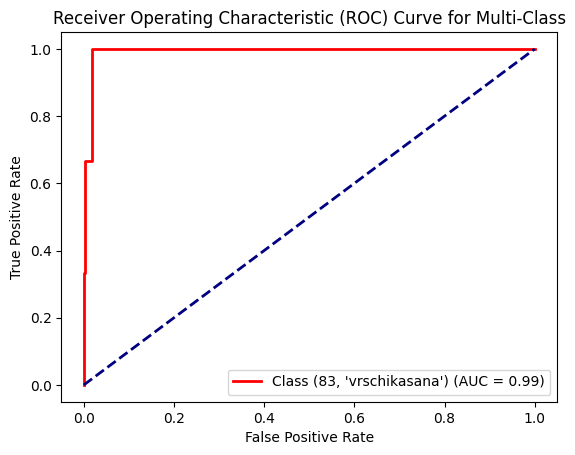

In [40]:
ROC_curve(model,test_labels_one_hot,legend_dict)